# 합성곱 신경망(Convolutional Neural Networks, CNNs)

- 이미지 인식, 음성 인식 등에 자주 사용되는데,  
  특히, 이미지 인식 분야에서 거의 모든 딥러닝 기술에 사용

<br>

## 컨볼루션 신경망의 등장
- 1989년 얀 르쿤(Yann LeCun) 교수의 논문에서 발표

  - 필기체 인식에서 의미가 있었지만 범용화하는데에는 무리

- 1998년, "Gradient-Based Learning Applied to Document Recognition"이라는 논문에서 LeNet-5 제시

- 합성곱 층(convolution layer), 풀링 층(pooling layer) 소개
  <br>

  <img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>


## 완전연결계층과의 차이
- 완전연결계층(Fully-Connected Layer)은 이미지와 같은 데이터의 형상(3차원)을 무시함  

- 모든 입력데이터를 동등하게 취급  
  즉, **데이터의 특징을 잃어버리게 됨**

- 컨볼루션층(convolution layer)은 <u>**이미지 픽셀 사이의 관계를 고려**</u>

- 완전연결계층은 공간정보를 손실하지만, 컨볼루션층은 공간정보를 유지  
  - 이미지와 같은 2차원(흑백) 또는 3차원(컬러)의 형상을 유지

  - 공간정보를 유지하기 때문에 완전연결계층에 비해 적은 수의 파라미터를 요구


## 컨볼루션 신경망 구조 예시

<img src="https://www.oreilly.com/library/view/neural-network-projects/9781789138900/assets/c38754ca-f2ea-425a-b7a6-1fe0f2f5074e.png" width="600">

<sub>출처: https://www.oreilly.com/library/view/neural-network-projects/9781789138900/8e87ad66-6de3-4275-81a4-62b54436bf16.xhtml</sub>



## 합성곱 연산
- 필터(filter) 연산
  - 입력 데이터에 필터를 통한 어떠한 연산을 진행
  
  - **필터에 대응하는 원소끼리 곱하고, 그 합을 구함**

  - 연산이 완료된 결과 데이터를 **특징 맵(feature map)**이라 부름

- 필터(filter)
  - 커널(kernel)이라고도 칭함
  
  - 흔히 사진 어플에서 사용하는 '이미지 필터'와 비슷한 개념

  - 필터의 사이즈는 "거의 항상 홀수"
    - 짝수이면 패딩이 비대칭이 되어버림
  
    - 왼쪽, 오른쪽을 다르게 주어야함
  
    - 중심위치가 존재, 즉 구별된 하나의 픽셀(중심 픽셀)이 존재

  - 필터의 학습 파라미터 개수는 입력 데이터의 크기와 상관없이 일정  
    따라서, 과적합을 방지할 수 있음

  <br>
  <img src="http://deeplearning.net/software/theano_versions/dev/_images/numerical_no_padding_no_strides.gif">

  <sub>출처: http://deeplearning.net/software/theano_versions/dev/tutorial/conv_arithmetic.html</sub>


- 연산 시각화
  <img src="https://www.researchgate.net/profile/Ihab_S_Mohamed/publication/324165524/figure/fig3/AS:611103423860736@1522709818959/An-example-of-convolution-operation-in-2D-2.png" width="500">

  <sub>출처: https://www.researchgate.net/figure/An-example-of-convolution-operation-in-2D-2_fig3_324165524</sub>


- 일반적으로, 합성곱 연산을 한 후의 데이터 사이즈는  
  ### $\quad (n-f+1) \times (n-f+1)$
    $n$: 입력 데이터의 크기  
    $f$: 필터(커널)의 크기


  <img src="https://miro.medium.com/max/1400/1*Fw-ehcNBR9byHtho-Rxbtw.gif" width="400">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>
  
  위 예에서 입력 데이터 크기($n$)는 5, 필터의 크기($k$)는 3이므로  
  출력 데이터의 크기는 $(5 - 3 + 1) = 3$


## 패딩(padding)과 스트라이드(stride)
- 필터(커널) 사이즈과 함께 **입력 이미지와 출력 이미지의 사이즈를 결정**하기 위해 사용

- 사용자가 결정할 수 있음



### 패딩
- 입력 데이터의 주변을 특정 값으로 채우는 기법
  - 주로 0으로 많이 채움

  <img src="http://deeplearning.net/software/theano_versions/dev/_images/arbitrary_padding_no_strides.gif" width="300">

- 출력 데이터의 크기
  ### $\quad (n+2p-f+1) \times (n+2p-f+1)$

  위 그림에서, 입력 데이터의 크기($n$)는 5, 필터의 크기($f$)는 4, 패딩값($p$)은 2이므로    
  출력 데이터의 크기는 ($5 + 2\times 2 - 4 + 1) = 6$

### 'valid' 와 'same'
- 'valid'
  - 패딩을 주지 않음
  - padding=0 (0으로 채워진 테두리가 아니라 패딩을 주지 않는다는 의미)

- 'same'
  - 패딩을 주어 입력 이미지의 크기와 연산 후의 이미지 크기를 같게함

  - 만약, 필터(커널)의 크기가 $k$ 이면,  
    패딩의 크기는 $p = \frac{k-1}{2}$ (단, <u>stride=1)</u>



### 스트라이드
- 필터를 적용하는 간격을 의미

- 아래는 그림의 간격 2

  <img src="http://deeplearning.net/software/theano_versions/dev/_images/no_padding_strides.gif">


## 출력 데이터의 크기

## $\qquad OH = \frac{H + 2P - FH}{S} + 1 $ 
## $\qquad OW = \frac{W + 2P - FW}{S} + 1 $ 

- 입력 크기 : $(H, W)$

- 필터 크기 : $(FH, FW)$

- 출력 크기 : $(OH, OW)$

- 패딩, 스트라이드 : $P, S$

- (주의) 
  - 위 식의 값에서 $\frac{H + 2P - FH}{S}$ 또는 $\frac{W + 2P - FW}{S}$가 정수로 나누어 떨어지는 값이어야 함
  - 만약, 정수로 나누어 떨어지지 않으면  
    패딩, 스트라이드값을 조정하여 정수로 나누어 떨어지게 해야함


## 풀링(Pooling)

- 필터(커널) 사이즈 내에서 특정 값을 추출하는 과정

### 맥스 풀링(Max Pooling)
- 가장 많이 사용되는 방법

- 출력 데이터의 사이즈 계산은 컨볼루션 연산과 동일
## $\quad OH = \frac{H + 2P - FH}{S} + 1 $ 
## $\quad OW = \frac{W + 2P - FW}{S} + 1 $ 

- 일반적으로 stride=2, kernel_size=2 를 통해  
  **특징맵의 크기를 <u>절반으로 줄이는 역할</u>**

- 모델이 물체의 주요한 특징을 학습할 수 있도록 해주며,  
  컨볼루션 신경망이 이동 불변성 특성을 가지게 해줌
  - 예를 들어, 아래의 그림에서 초록색 사각형 안에 있는  
    2와 8의 위치를 바꾼다해도 맥스 풀링 연산은 8을 추출

- 모델의 파라미터 개수를 줄여주고, 연산 속도를 빠르게 해줌

  <br>

  <img src="https://cs231n.github.io/assets/cnn/maxpool.jpeg" width="600">

  <sub>출처: https://cs231n.github.io/convolutional-networks/</sub>

### 평균 풀링(Avg Pooling)

- 필터 내의 있는 픽셀값의 평균을 구하는 과정

- 과거에 많이 사용, 요즘은 잘 사용되지 않는다.

- 맥스풀링과 마찬가지로 stride=2, kernel_size=2 를 통해  
  특징 맵의 사이즈를 줄이는 역할

  <img src="https://www.researchgate.net/profile/Juan_Pedro_Dominguez-Morales/publication/329885401/figure/fig21/AS:707709083062277@1545742402308/Average-pooling-example.png" width="600">

  <sub>출처: https://www.researchgate.net/figure/Average-pooling-example_fig21_329885401</sub>

## 합성곱 연산의 의미

## 2차원 이미지에 대한 필터 연산 예시
  - 가장 자리 검출(Edge-Detection)

  - 소벨 필터(Sobel Filter)

    - Horizontal : 가로 방향의 미분을 구하는 필터 역할

    - Vertical : 세로 방향의 미분을 구하는 필터 역할  

  <img src="https://encrypted-tbn0.gstatic.com/images?q=tbn%3AANd9GcT_ZRkuiCkv0ZEHFiyCp-7Y5bCL0liaYSQ4mg&usqp=CAU" width="350">

  <sub>출처: https://www.cloras.com/blog/image-recognition/</sub>


### modules import

In [64]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import urllib
import requests
from io import BytesIO


### util functions

In [65]:
def url_to_img(url, gray=False):
    resp = urllib.request.urlopen(url)
    img = np.asarray(bytearray(resp.read()), dtype="uint8")

    if gray:
        img = cv2.imdecode(img, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imdecode(img, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return img

def filtered_img(img, filter: np.ndarray, output_size):
    filtered_img = np.zeros((output_size, output_size))
    filter_size = filter.shape[0]

    for i in range(output_size):
        for j in range(output_size):
            multiply_vals = img[i:i + filter_size, j:j + filter_size] * filter
            sum_val = np.sum(multiply_vals)

            if (sum_val) > 255:
                sum_val = 255
            
            filtered_img[i, j] = sum_val
    return filtered_img

### 이미지 확인
- 예시이므로 정사각형 사이즈로 진행

(440, 440)


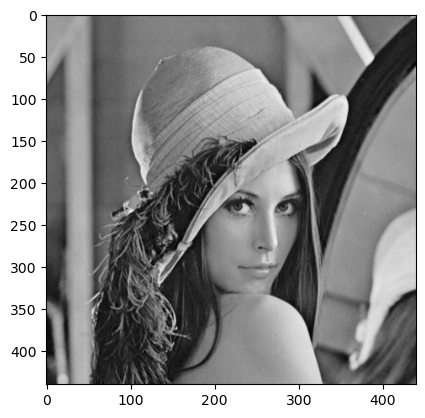

In [66]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

img = url_to_img(img_url, gray=True)

print(img.shape)
plt.imshow(img, cmap="gray")
plt.show()

### 필터연산 적용

output size: 438


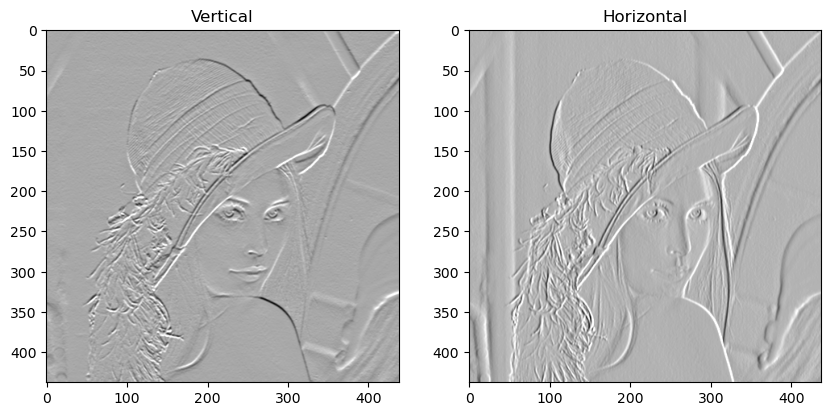

In [67]:
vertical_filter = np.array([
    [1, 2, 1],
    [0, 0, 0],
    [-1, -2, -1]
], dtype=np.float32)

horizontal_filter = np.array([
    [1, 0, -1],
    [2, 0, -2],
    [1, 0, -1]
], dtype=np.float32)

output_size = int((img.shape[0] - 3) / 1 + 1)
print(f"output size: {output_size}")

vertical_filtered = filtered_img(img, vertical_filter, output_size)
horizontal_filtered = filtered_img(img, horizontal_filter, output_size)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Vertical")
plt.imshow(vertical_filtered, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Horizontal")
plt.imshow(horizontal_filtered, cmap="gray")

plt.show()

### 이미지 필터를 적용한 최종 결과

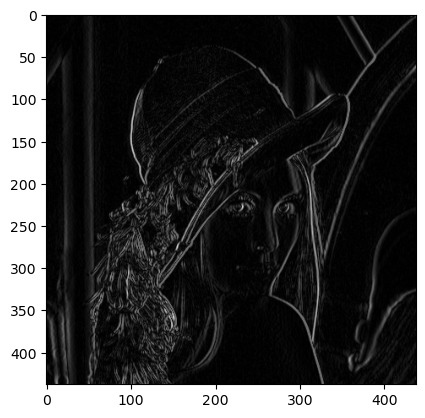

In [68]:
sobel_img = np.sqrt(np.square(horizontal_filtered) + np.square(horizontal_filtered))

plt.imshow(sobel_img, cmap="gray")
plt.show()

## 3차원 데이터의 합성곱 연산
- **이미지는 3차원으로 구성**
  - (가로, 세로, 채널 수)
  - 채널 : RGB 

- 색상값의 정도에 따라 color색 결정

  <img src="https://www.projectorcentral.com/images/articles/RGB-Explained-600.jpg">

  <sub>출처: https://www.projectorcentral.com/All-About-Bit-Depth.htm?page=What-Bit-Depth-Looks-Like</sub>

### 아래의 이미지 확인은 참고사항

(440, 440, 3)


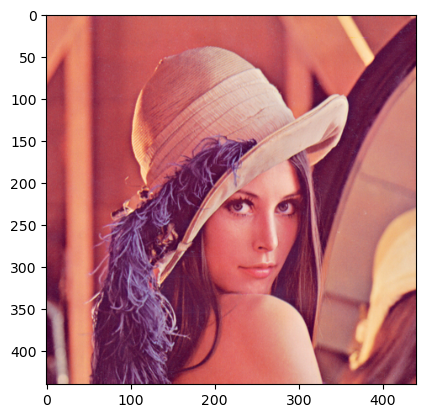

In [69]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

img = url_to_img(img_url)

print(img.shape)
plt.imshow(img)
plt.show()

In [70]:
img_copy = img.copy()
img_copy[:, :, 1] = 0
img_copy[:, :, 2] = 0
img_red = img_copy

In [71]:
print(img_red)

[[[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [233   0   0]
  [224   0   0]
  [202   0   0]]

 [[226   0   0]
  [225   0   0]
  [222   0   0]
  ...
  [232   0   0]
  [223   0   0]
  [201   0   0]]

 ...

 [[ 84   0   0]
  [ 86   0   0]
  [ 93   0   0]
  ...
  [174   0   0]
  [169   0   0]
  [172   0   0]]

 [[ 82   0   0]
  [ 86   0   0]
  [ 95   0   0]
  ...
  [177   0   0]
  [178   0   0]
  [183   0   0]]

 [[ 81   0   0]
  [ 86   0   0]
  [ 96   0   0]
  ...
  [178   0   0]
  [181   0   0]
  [185   0   0]]]


In [72]:
img_copy = img.copy()
img_copy[:, :, 0] = 0
img_copy[:, :, 2] = 0
img_green = img_copy

In [73]:
img_copy = img.copy()
img_copy[:, :, 0] = 0
img_copy[:, :, 1] = 0
img_blue = img_copy

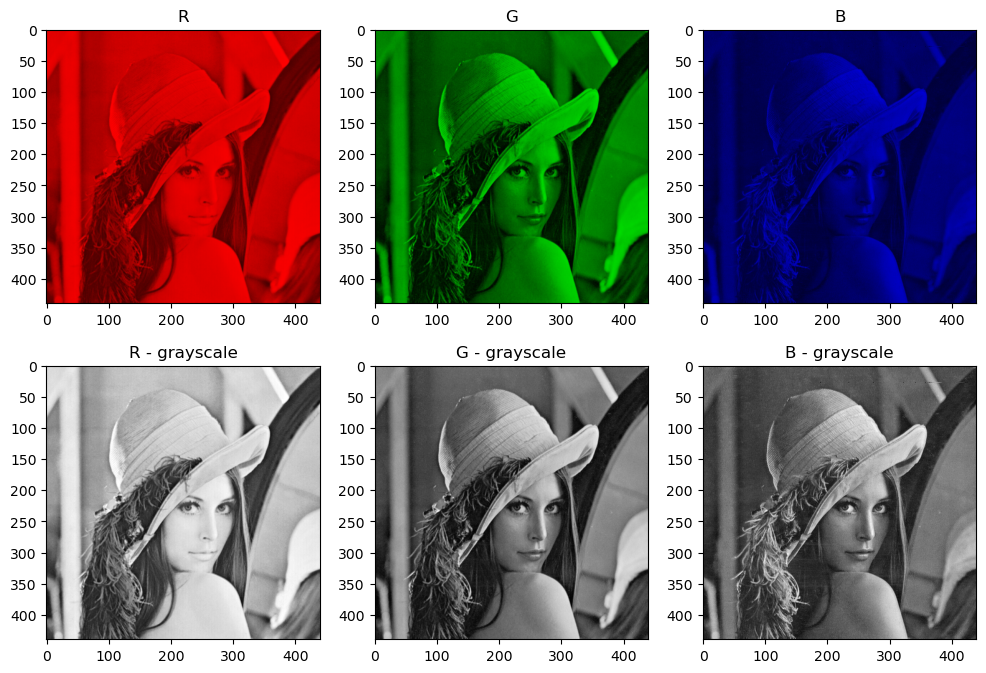

In [74]:
fig = plt.figure(figsize=(12, 8))
title_list = [
    "R", "G", "B",
    "R - grayscale", "G - grayscale", "B - grayscale"
]
img_list = [
    img_red, img_green, img_blue,
    img_red[:, :, 0], img_green[:, :, 1], img_blue[:, :, 2]
]

for i, img in enumerate(img_list):
    ax = fig.add_subplot(2, 3, i + 1)
    ax.title.set_text(title_list[i])
    
    if i >= 3:
        plt.imshow(img, cmap="gray")
    else:
        plt.imshow(img)

plt.show()

### 연산 과정

- 각 채널마다 컨볼루션 연산을 적용
  - 3채널을 모두 합쳐서 '하나의 필터'라고 칭함  
    
  <img src="https://miro.medium.com/max/2000/1*8dx6nxpUh2JqvYWPadTwMQ.gif" width="600">

<br>

- 각각의 결과를 더함  
  
  <img src="https://miro.medium.com/max/2000/1*CYB2dyR3EhFs1xNLK8ewiA.gif" width="600">

<br>

- 더한 결과에 편향을 더함  
  <img src="https://miro.medium.com/max/588/1*RYYucIh3U-YFxrIkyQKzRw.gif" width="300">

  <sub>출처: https://towardsdatascience.com/intuitively-understanding-convolutions-for-deep-learning-1f6f42faee1</sub>



### util functions

In [75]:
def url_to_img(url, gray=False):
    resp = urllib.request.urlopen(url)
    img = np.asarray(bytearray(resp.read()), dtype="uint8")

    if gray:
        img = cv2.imdecode(img, cv2.IMREAD_GRAYSCALE)
    else:
        img = cv2.imdecode(img, cv2.IMREAD_COLOR)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    
    return img

def conv_op(img: np.ndarray, kernel: np.ndarray, pad=0, stride=1):
    H, W, C = img.shape
    kernel_size = kernel.shape[0]

    out_h = (H + 2*pad - kernel_size) // stride + 1
    out_w = (W + 2*pad - kernel_size) // stride + 1

    filtered_img = np.zeros((out_h, out_w))
    img = np.pad(img, pad, "constant")

    for i in range(out_h):
        for j in range(out_w):
            for c in range(C):
                muliply_vals = img[i:i + kernel_size, j:j + kernel_size, c] * kernel
                sum_val = np.sum(muliply_vals)

                filtered_img[i, j] = sum_val
    filtered_img = filtered_img.reshape(1, out_h, out_w, -1).transpose(0, 3, 1, 2)

    return filtered_img.astype(np.uint8)

### 이미지 확인

(440, 440, 3)


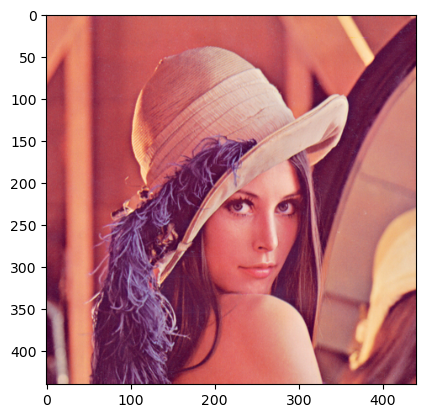

In [76]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"

img = url_to_img(img_url)

print(img.shape)
plt.imshow(img, cmap="gray")
plt.show()

### 필터연산 적용
- 3x3 크기의 3채널 필터 5개

- (5, 3, 3, 3) ----> (5개, 3채널, 세로, 가로)

In [77]:
filter_1 = np.random.randn(3, 3, 3)

print(filter_1)

[[[-1.0025242   0.86956303  0.06165586]
  [ 1.370785    1.43285708  1.4190787 ]
  [-1.13701412 -0.72572863 -0.75212073]]

 [[ 0.648167   -0.05438231  0.21534522]
  [-0.88430942  1.18568704  1.08598395]
  [ 2.22638539  0.77171903 -0.38917099]]

 [[ 0.80333458  0.81479257  2.35515513]
  [-1.89057113 -0.96613539  0.96046401]
  [ 1.83290573 -1.4361726   1.66520722]]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 438, 438)


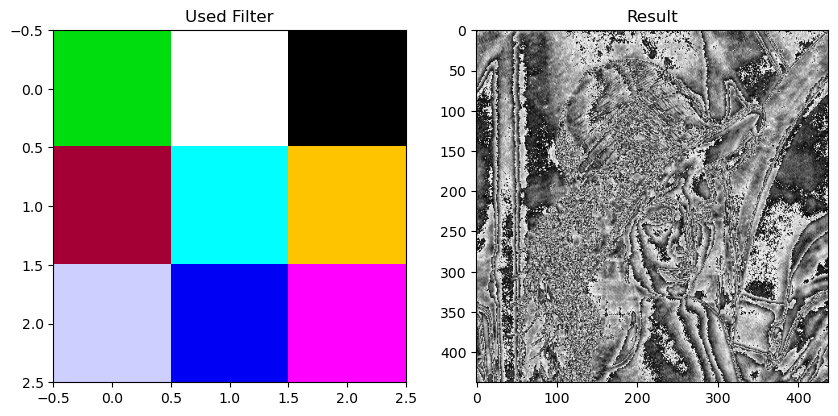

In [78]:
filtered_img_1 = conv_op(img, filter_1)
print(filtered_img_1.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Used Filter")
plt.imshow(filter_1, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img_1[0, 0, :, :], cmap="gray")

plt.show()

In [79]:
filter_2 = np.random.randn(3, 3, 3)

print(filter_2)

[[[ 0.92322001 -0.06945127  1.85455872]
  [-1.01131926  0.21245967 -0.98447509]
  [ 1.86057256 -0.08768073 -1.62456326]]

 [[-0.28007778  0.99347287 -0.71421382]
  [-1.18654831  0.0061861   0.58970374]
  [-0.69121676 -1.09247214  0.5435046 ]]

 [[ 0.70205605 -1.14316619  0.79670885]
  [-0.1519508  -0.21229416  2.59463032]
  [-1.35218168 -0.19413964 -1.19541093]]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 438, 438)


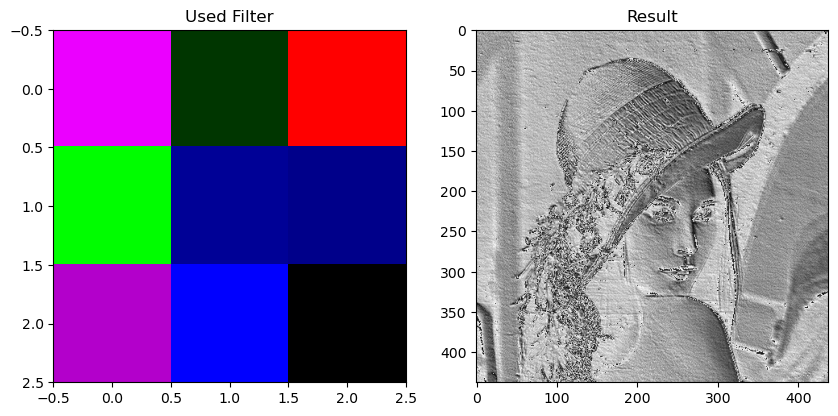

In [80]:
filtered_img_2 = conv_op(img, filter_2)
print(filtered_img_2.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Used Filter")
plt.imshow(filter_2, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img_2[0, 0, :, :], cmap="gray")

plt.show()

In [81]:
filter_3 = np.random.randn(3, 3, 3)

print(filter_3)

[[[ 1.20851516 -0.99625819 -1.21496381]
  [-0.94804511  1.37701073 -0.44617086]
  [-1.3367776   1.91205476 -1.20327225]]

 [[-0.18259816  0.09662097  0.47239926]
  [ 2.29233254  1.09856687  0.13705247]
  [ 2.53508632 -1.27935064 -0.79742007]]

 [[ 0.04067631 -0.60923229 -0.15742017]
  [ 1.06463172  0.98185198  0.77552276]
  [ 0.49210145  0.15494869 -0.8779285 ]]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 438, 438)


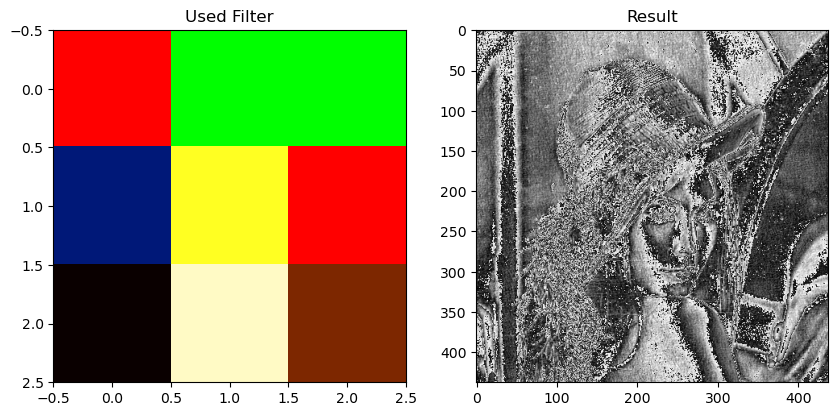

In [82]:
filtered_img_3 = conv_op(img, filter_3)
print(filtered_img_3.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Used Filter")
plt.imshow(filter_3, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img_3[0, 0, :, :], cmap="gray")

plt.show()

In [83]:
filter_4 = np.random.randn(3, 3, 3)

print(filter_4)

[[[ 1.70838171  0.72613577  0.11464311]
  [ 1.16043931  0.25411326  1.21448801]
  [-0.73954663  0.08471838 -1.60454332]]

 [[-0.20843057 -1.95210144  0.33276457]
  [ 0.15857532  0.96501366  0.53614755]
  [ 0.50735403 -0.21601682  0.11816937]]

 [[-0.51900858 -2.70657105 -0.11828272]
  [ 0.71918337  0.00580608 -0.27070299]
  [-0.58802299  2.59136564  0.73579562]]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 438, 438)


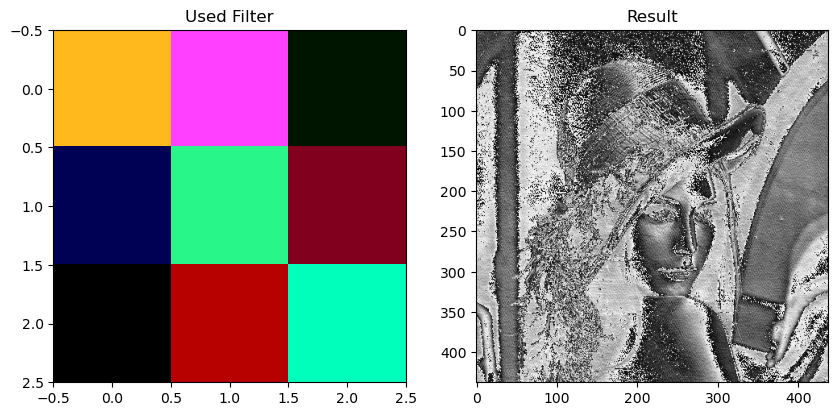

In [84]:
filtered_img_4 = conv_op(img, filter_4)
print(filtered_img_4.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Used Filter")
plt.imshow(filter_4, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img_4[0, 0, :, :], cmap="gray")

plt.show()

In [85]:
filter_5 = np.random.randn(3, 3, 3)

print(filter_5)

[[[-0.41918754 -0.25609623 -0.38416631]
  [-0.2585316  -0.54303733  0.24322379]
  [-0.06352631 -0.2299832   0.20128116]]

 [[-1.09978839 -1.66682623 -0.50657546]
  [-0.13834384  0.91320965  1.66357996]
  [ 1.44887277 -0.77532158 -0.05884339]]

 [[ 0.66577849 -0.67157269 -1.50185527]
  [-0.36770481 -0.298001   -0.73021468]
  [-0.02576659  0.57399001  0.09654446]]]


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


(1, 1, 438, 438)


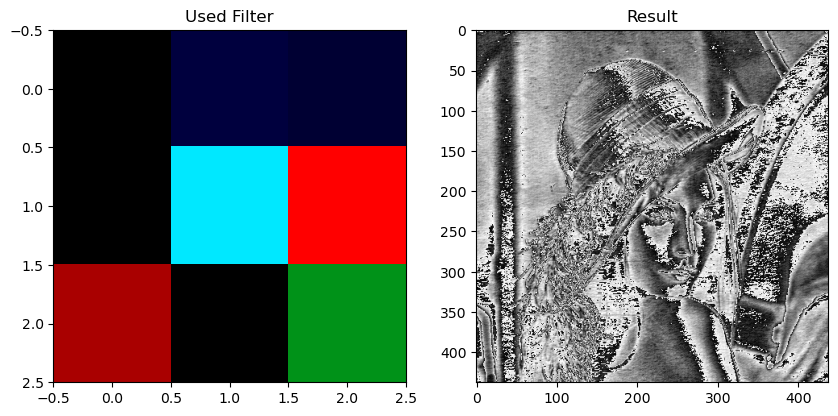

In [86]:
filtered_img_5 = conv_op(img, filter_5)
print(filtered_img_5.shape)

plt.figure(figsize=(10, 10))
plt.subplot(1, 2, 1)
plt.title("Used Filter")
plt.imshow(filter_5, cmap="gray")

plt.subplot(1, 2, 2)
plt.title("Result")
plt.imshow(filtered_img_5[0, 0, :, :], cmap="gray")

plt.show()

### 필터연산을 적용한 최종 결과

(1, 1, 438, 438)


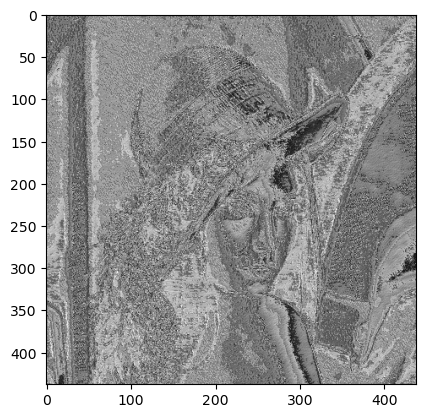

In [87]:
filtered_img = np.stack([filtered_img_1, filtered_img_2, filtered_img_3, filtered_img_4, filtered_img_5]).sum(axis=0)
print(filtered_img.shape)

plt.imshow(filtered_img[0, 0, :, :], cmap="gray")
plt.show()

### 전체 과정 한번에 보기

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


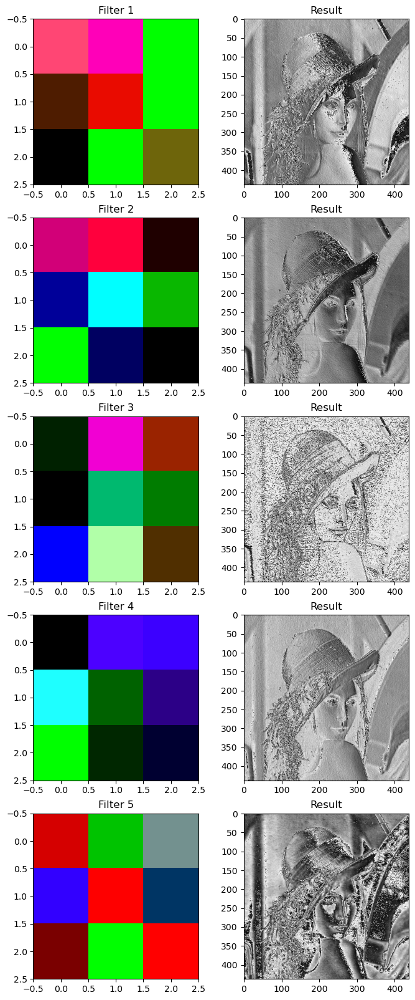

In [88]:
np.random.seed(222)

fig = plt.figure(figsize=(8, 20))

filter_num = 5
filtered_img = []

for i in range(filter_num):
    filter = np.random.randn(3, 3, 3)
    ax = fig.add_subplot(5, 2, 2*i + 1)
    ax.title.set_text(f"Filter {i + 1}")
    plt.imshow(filter)

    ax = fig.add_subplot(5, 2, 2*i + 2)
    ax.title.set_text(f"Result")
    filtered = conv_op(img, filter)
    plt.imshow(filtered[0, 0, :, :], cmap="gray")
    filtered_img.append(filtered)

plt.show()

(1, 1, 438, 438)


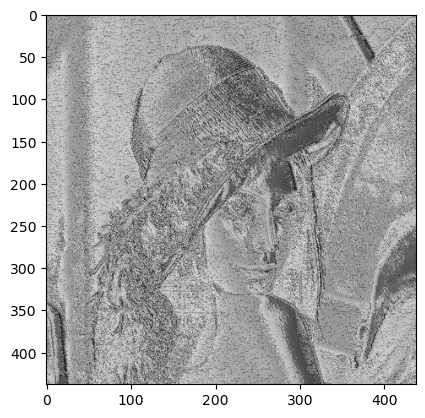

In [89]:
filtered_img = np.stack(filtered_img).sum(axis=0)
print(filtered_img.shape)

plt.imshow(filtered_img[0, 0, :, :], cmap="gray")
plt.show()

# 합성곱 신경망 구현
- 참고: 밑바닥부터 시작하는 딥러닝1

## 합성곱 층(Convolution Layer)

In [90]:
def img_to_col(inp_data: np.ndarray, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = inp_data.shape
    out_h = (H + 2*pad - filter_h) // stride + 1
    out_w = (W + 2*pad - filter_w) // stride + 1

    img = np.pad(inp_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], "constant")
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]
    
    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N * out_h * out_w, -1)
    
    return col

In [91]:
def col_to_img(col: np.ndarray, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h) // stride + 1
    out_w = (W + 2*pad - filter_w) // stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2 * pad + stride - 1, W + 2 * pad + stride - 1))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]

In [93]:
class Conv2D:
    def __init__(self, W, b, stride=1, pad=0):
        self.W = W
        self.b = b
        self.stride = stride
        self.pad = pad 

        self.input_data = None
        self.col = None
        self.col_W = None  

        self.dW = None
        self.db = None
    
    def forward(self, input_data: np.ndarray):
        FN, C, FH, FW = self.W.shape
        N, C, H, W = input_data.shape
        out_h = (H + 2 * self.pad - FH) // self.stride + 1
        out_w = (W + 2 * self.pad - FW) // self.stride + 1

        col = img_to_col(input_data, FH, FW, self.stride, self.pad)
        col_W = self.W.reshape(FN, -1).T

        out = np.dot(col, col_W) + self.b
        output = out.reshape(N, out_h, out_w, -1).transpose(0, 3, 1, 2)
    
        self.input_data = input_data
        self.col = col
        self.col_W = col_W

        return output

    def backward(self, dout):
        FN, C, FH, FW = self.W.shape
        dout = dout.transpose(0, 2, 3, 1).reshape(-1, FN)

        self.db = np.sum(dout, axis=0)
        self.dW = np.dot(self.col.T, dout)
        self.dW = self.dW.transpose(1, 0).reshape(FN, C, FH, FW)

        dcol = np.dot(dout, self.col_W.T)
        dx = col_to_img(dcol, self.input_data.shape, FH, FW, self.stride, self.pad)

        return dx

### 컨볼루션 레이어 테스트

In [94]:
def init_weight(num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
    weights = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
    biases = np.zeros(num_filters)

    return weights, biases

img shape: (440, 440, 1)


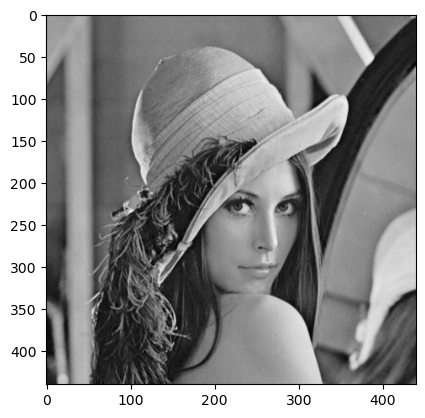

In [95]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_gray = url_to_img(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)
print(f"img shape: {img_gray.shape}")

img_gray = np.expand_dims(img_gray.transpose(2, 0, 1), axis=0)

plt.imshow(img_gray[0, 0, :, :], cmap="gray")
plt.show()

In [96]:
W, b = init_weight(1, 1, 3)
conv = Conv2D(W, b)
output = conv.forward(img_gray)

print(f"Conv Layer size: {output.shape}")

Conv Layer size: (1, 1, 438, 438)


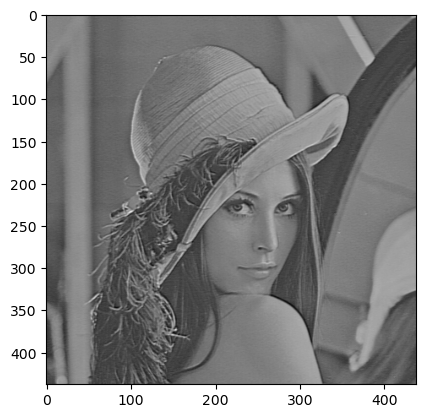

In [97]:
plt.imshow(output[0, 0, :, :], cmap="gray")
plt.show()

In [103]:
W2, b2 = init_weight(1, 1, 3, stride=2)
conv2 = Conv2D(W2, b2, stride=2)
output2 = conv2.forward(img_gray)

print(f"Conv Layer size: {output2.shape}")

Conv Layer size: (1, 1, 219, 219)


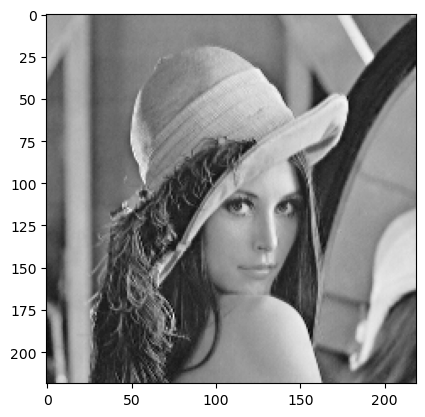

In [104]:
plt.imshow(output2[0, 0, :, :], cmap="gray")
plt.show()

img shape: (440, 440, 3)


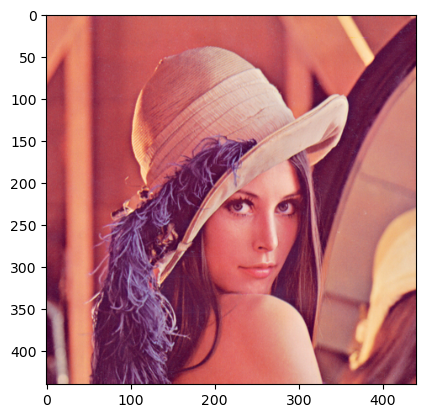

img shape: (1, 3, 440, 440)


In [105]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_color = url_to_img(img_url)
print(f"img shape: {img_color.shape}")

plt.imshow(img_color)
plt.show()

img_color = np.expand_dims(img_color.transpose(2, 0, 1), axis=0)
print(f"img shape: {img_color.shape}")

In [106]:
W3, b3 = init_weight(10, 3, 3)
conv3 = Conv2D(W3, b3)
output3 = conv3.forward(img_color)

print(f"Conv Layer size: {output3.shape}")

Conv Layer size: (1, 10, 438, 438)


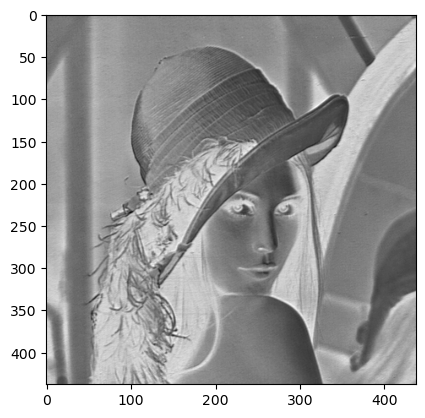

In [108]:
plt.imshow(output3[0, 3, :, :], cmap="gray")
plt.show()

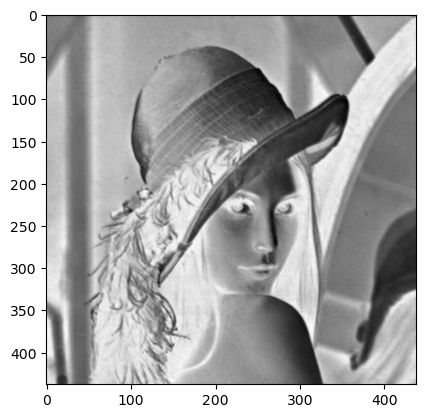

In [109]:
plt.imshow(output3[0, 8, :, :], cmap="gray")
plt.show()

### 동일한 이미지 여러 장 테스트 (배치 처리)

In [110]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_gray = url_to_img(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)

img_gray = img_gray.transpose(2, 0, 1)

print(f"img shape: {img_gray.shape}")

img shape: (1, 440, 440)


In [111]:
batch_img_gray = np.repeat(img_gray[np.newaxis, :, :, :], 15, axis=0)

print(batch_img_gray.shape)

(15, 1, 440, 440)


In [118]:
W4, b4 = init_weight(10, 1, 3, stride=2)
conv4 = Conv2D(W4, b4, stride=2)
output4 = conv4.forward(batch_img_gray)

print(f"Conv Layer size: {output4.shape}")

Conv Layer size: (15, 10, 219, 219)


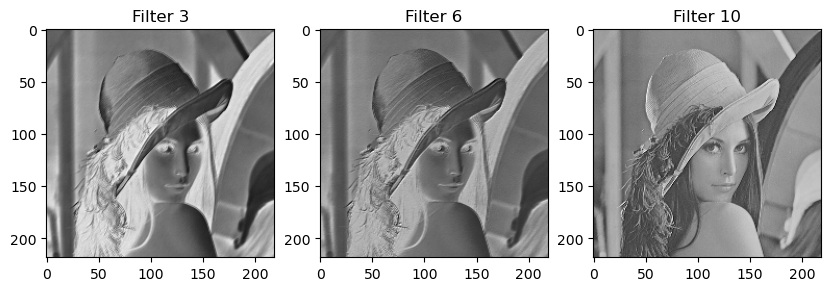

In [119]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 3")
plt.imshow(output4[3, 2, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Filter 6")
plt.imshow(output4[3, 5, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Filter 10")
plt.imshow(output4[3, 9, :, :], cmap="gray")

plt.show()

In [120]:
W5, b5 = init_weight(32, 3, 3, stride=3)
conv5 = Conv2D(W5, b5, stride=3)
output5 = conv5.forward(img_color)

print(f"Conv Layer size: {output5.shape}")

Conv Layer size: (1, 32, 146, 146)


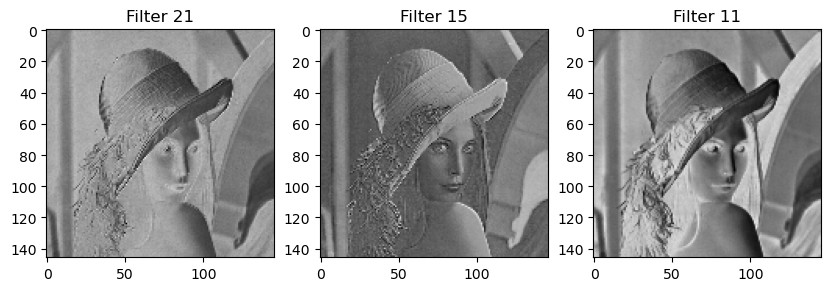

In [121]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 21")
plt.imshow(output5[0, 20, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Filter 15")
plt.imshow(output5[0, 14, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Filter 11")
plt.imshow(output5[0, 10, :, :], cmap="gray")

plt.show()

### 동일한 이미지 배치처리(color)

In [123]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_color = url_to_img(img_url)

img_color = img_color.transpose(2, 0, 1)
print(f"img shape: {img_color.shape}")

img shape: (3, 440, 440)


In [125]:
batch_img_color = np.repeat(img_color[np.newaxis, :, :, :], 15, axis=0)

print(batch_img_color.shape)

(15, 3, 440, 440)


In [126]:
W6, b6 = init_weight(64, 3, 5)
conv6 = Conv2D(W6, b6)
output6 = conv6.forward(batch_img_color)

print(f"Conv Layer size: {output6.shape}")

Conv Layer size: (15, 64, 436, 436)


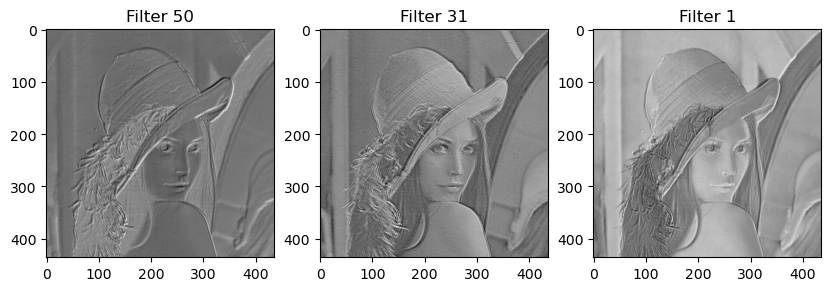

In [128]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Filter 50")
plt.imshow(output6[10, 49, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Filter 31")
plt.imshow(output6[10, 30, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Filter 1")
plt.imshow(output6[10, 0, :, :], cmap="gray")

plt.show()

## 풀링 층(Pooling Layer)

In [129]:
class Pooling2D:
    def __init__(self, kernel_size=2, stride=1, pad=0):
        self.kernel_size = kernel_size
        self.stride = stride
        self.pad = pad

        self.input_data = None
        self.arg_max = None
    
    def forward(self, input_data: np.ndarray):
        N, C, H, W = input_data.shape
        out_h = (H - self.kernel_size) // self.stride + 1
        out_w = (W - self.kernel_size) // self.stride + 1

        col = img_to_col(input_data, self.kernel_size, self.kernel_size, self.stride, self.pad)
        col = col.reshape(-1, self.kernel_size * self.kernel_size)

        arg_max = np.argmax(col, axis=1)
        out = np.max(col, axis=1)
        output = out.reshape(N, out_h, out_w, C).transpose(0, 3, 1, 2)

        self.input_data = input_data
        self.arg_max = arg_max

        return output
    
    def backward(self, dout):
        dout = dout.transpose(0, 2, 3, 1)

        pool_size = self.kernel_size * self.kernel_size
        dmax = np.zeros((dout.size, pool_size))
        dmax[np.arange(self.arg_max.size), self.arg_max.flatten()] = dout.flatten()
        dmax = dmax.reshape(dout.shape + (pool_size,))

        dcol = dmax.reshape(dmax.shape[0] * dmax.shape[1] * dmax.shape[2], -2)
        dx = col_to_img(dcol, self.input_data.shape, self.kernel_size, self.kernel_size, stride=self.stride, pad=self.pad)

        return dx

### 풀링 레이어 테스트
- 2차원 이미지
  - (Height, Width, 1)

img shape: (1, 1, 440, 440)


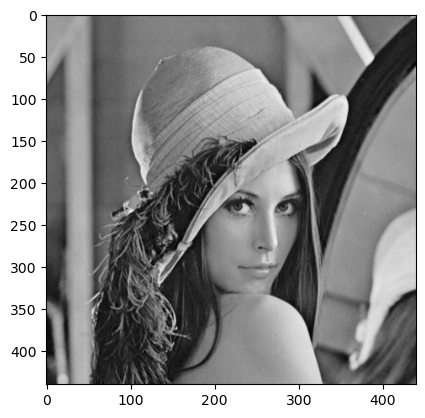

In [132]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_gray = url_to_img(img_url, gray=True)
img_gray = img_gray.reshape(img_gray.shape[0], -1, 1)

img_gray = np.expand_dims(img_gray.transpose(2, 0, 1), axis=0)

print(f"img shape: {img_gray.shape}")

plt.imshow(img_gray[0, 0, :, :], cmap="gray")
plt.show()

In [133]:
W, b = init_weight(8, 1, 3)
conv = Conv2D(W, b)
pool = Pooling2D(kernel_size=2, stride=2)

In [135]:
output1 = conv.forward(img_gray)

print(f"Conv Layer size: {output1.shape}")

Conv Layer size: (1, 8, 438, 438)


In [136]:
output1 = pool.forward(output1)

print(f"Pooling Layer size: {output1.shape}")

Pooling Layer size: (1, 8, 219, 219)


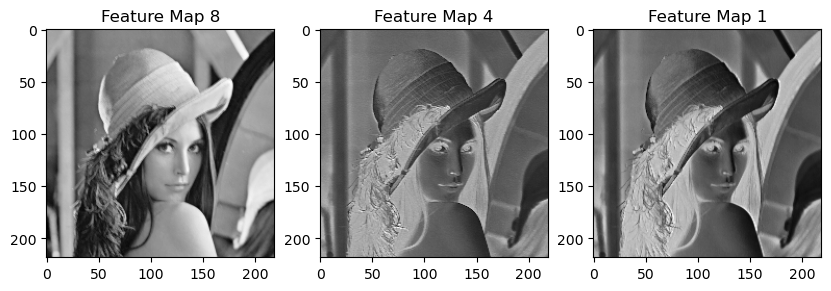

In [137]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output1[0, 7, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output1[0, 3, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output1[0, 0, :, :], cmap="gray")

plt.show()

In [138]:
W2, b2 = init_weight(32, 1, 3, stride=2)
conv = Conv2D(W2, b2, stride=2)
pool = Pooling2D(kernel_size=2, stride=2)

In [140]:
output2 = conv.forward(img_gray)
output2 = pool.forward(output2)

print(f"Pooling Layer size: {output2.shape}")

Pooling Layer size: (1, 32, 109, 109)
(1, 32, 109, 109)


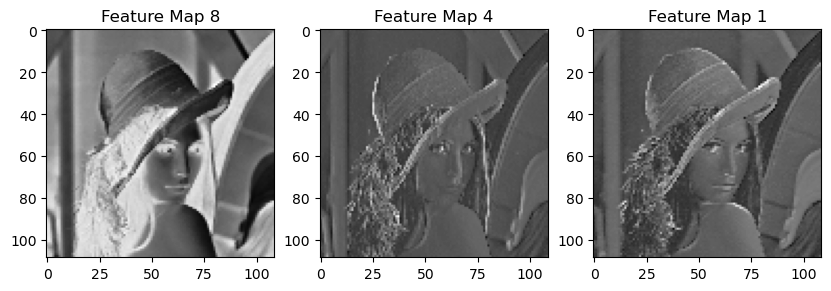

In [141]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 8")
plt.imshow(output2[0, 7, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Feature Map 4")
plt.imshow(output2[0, 3, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Feature Map 1")
plt.imshow(output2[0, 0, :, :], cmap="gray")

plt.show()

### 동일한 이미지 배치처리
- Color Image

- conv --> maxpooling --> conv --> maxpooling

- 시각화 과정
  - 5번째 이미지
  - [2, 5, 9] 필터를 통해 확인

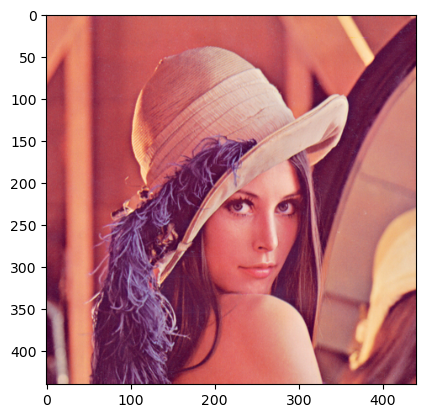

img shape: (3, 440, 440)


In [143]:
img_url = "https://upload.wikimedia.org/wikipedia/ko/thumb/2/24/Lenna.png/440px-Lenna.png"
img_color = url_to_img(img_url)

plt.imshow(img_color)
plt.show()

img_color = img_color.transpose(2, 0, 1)
print(f"img shape: {img_color.shape}")

In [144]:
batch_img_color = np.repeat(img_color[np.newaxis, :, :, :], 15, axis=0)

print(batch_img_color.shape)

(15, 3, 440, 440)


In [150]:
W, b = init_weight(10, 3, 3)
conv1 = Conv2D(W, b)
pool = Pooling2D(kernel_size=2, stride=2)

In [151]:
output1 = conv1.forward(batch_img_color)

print(output1.shape)

(15, 10, 438, 438)


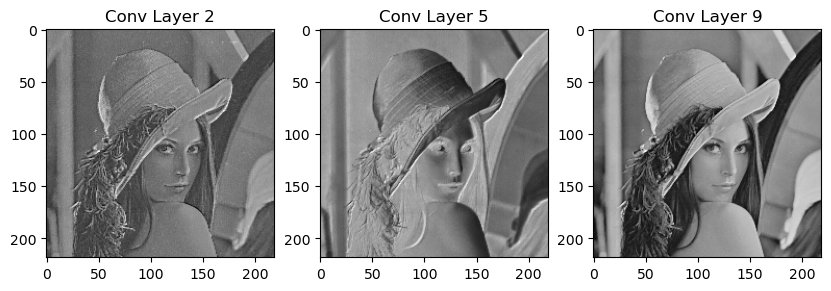

In [155]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Conv Layer 2")
plt.imshow(output1[4, 1, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Conv Layer 5")
plt.imshow(output1[4, 4, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Conv Layer 9")
plt.imshow(output1[4, 8, :, :], cmap="gray")

plt.show()

In [153]:
output1 = pool.forward(output1)

print(output1.shape)

(15, 10, 219, 219)


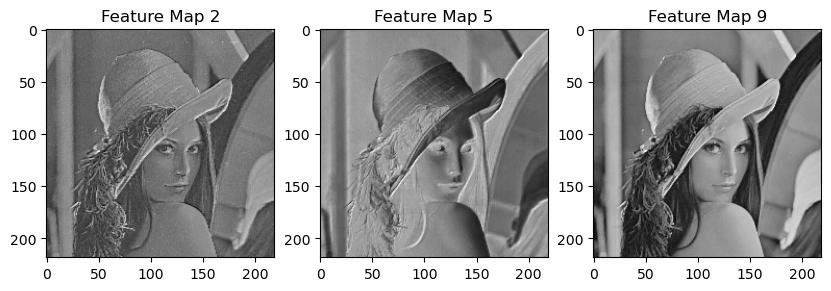

In [154]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output1[4, 1, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output1[4, 4, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output1[4, 8, :, :], cmap="gray")

plt.show()

In [156]:
W2, b2 = init_weight(30, 10, 3)
conv2 = Conv2D(W2, b2)
pool2 = Pooling2D(kernel_size=2, stride=2)

In [157]:
output2 = conv2.forward(output1)

print(output2.shape)

(15, 30, 217, 217)


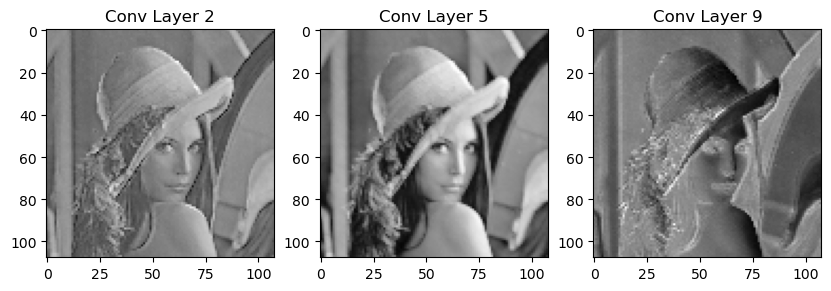

In [162]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Conv Layer 2")
plt.imshow(output2[4, 1, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Conv Layer 5")
plt.imshow(output2[4, 4, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Conv Layer 9")
plt.imshow(output2[4, 8, :, :], cmap="gray")

plt.show()

In [159]:
output2 = pool.forward(output2)

print(output2.shape)

(15, 30, 108, 108)


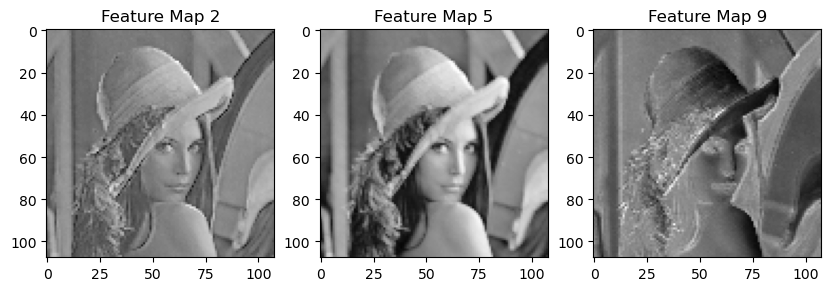

In [161]:
plt.figure(figsize=(10, 10))

plt.subplot(1, 3, 1)
plt.title("Feature Map 2")
plt.imshow(output2[4, 1, :, :], cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Feature Map 5")
plt.imshow(output2[4, 4, :, :], cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Feature Map 9")
plt.imshow(output2[4, 8, :, :], cmap="gray")

plt.show()

# 대표적인 CNN 모델 소개

## LeNet - 5

<img src="https://miro.medium.com/max/4308/1*1TI1aGBZ4dybR6__DI9dzA.png">
  
  <center>[LeNet-5 구조]</center>

  <sub>출처: https://medium.com/@pechyonkin/key-deep-learning-architectures-lenet-5-6fc3c59e6f4</sub>

## AlexNet

- 활성화 함수로 **ReLU** 사용

- 국소적 정규화(Local Response normalization, LRN) 실시하는 계층 사용

- 드롭아웃

  <img src="https://miro.medium.com/proxy/1*qyc21qM0oxWEuRaj-XJKcw.png" width="800">

  <center>[AlexNet 구조]</center>

  <sub>출처: http://www.cs.toronto.edu/~hinton/absps/imagenet.pdf</sub>

## VGG - 16

- 모든 컨볼루션 레이어에서의 필터(커널) 사이즈를 **3x3**으로 설정

- 2x2 MaxPooling

- 필터의 개수는 Conv Block을 지나가면서 2배씩 증가  
  32 -> 64 -> 128

  <br>

  <img src="https://www.researchgate.net/profile/Jose_Cano31/publication/327070011/figure/fig1/AS:660549306159105@1534498635256/VGG-16-neural-network-architecture.png" width="800">

  <center>[VGG-16 구조]</center>

  <sub>출처: Very Deep Convolutional Networks for Large-Scale Image Recognition</sub>

# CNN 학습 구현 - MNIST

## modules import

In [163]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
from collections import OrderedDict

## Util Functions

In [164]:
def img_to_col(inp_data: np.ndarray, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = inp_data.shape
    out_h = (H + 2*pad - filter_h) // stride + 1
    out_w = (W + 2*pad - filter_w) // stride + 1

    img = np.pad(inp_data, [(0, 0), (0, 0), (pad, pad), (pad, pad)], "constant")
    col = np.zeros((N, C, filter_h, filter_w, out_h, out_w))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            col[:, :, y, x, :, :] = img[:, :, y:y_max:stride, x:x_max:stride]
    
    col = col.transpose(0, 4, 5, 1, 2, 3).reshape(N * out_h * out_w, -1)
    
    return col

def col_to_img(col: np.ndarray, input_shape, filter_h, filter_w, stride=1, pad=0):
    N, C, H, W = input_shape
    out_h = (H + 2*pad - filter_h) // stride + 1
    out_w = (W + 2*pad - filter_w) // stride + 1
    col = col.reshape(N, out_h, out_w, C, filter_h, filter_w).transpose(0, 3, 4, 5, 1, 2)

    img = np.zeros((N, C, H + 2 * pad + stride - 1, W + 2 * pad + stride - 1))

    for y in range(filter_h):
        y_max = y + stride * out_h
        for x in range(filter_w):
            x_max = x + stride * out_w
            img[:, :, y:y_max:stride, x:x_max:stride] += col[:, :, y, x, :, :]

    return img[:, :, pad:H + pad, pad:W + pad]

def softmax(x):
    if x.ndim == 2:
        x = x.T
        x = x - np.max(x, axis=0)
        y = np.exp(x) / np.sum(np.exp(x), axis=0)
        return y.T
    
    x = x - np.max(x)
    return np.exp(x) / np.sum(np.exp(x))

def mean_squared_error(pred_y, true_y):
    return 0.5 * np.sum(np.square(pred_y - true_y))

def cross_entropy_error(pred_y, true_y):
    if pred_y.ndim == 1:
        true_y = true_y.reshape(1, true_y.size)
        pred_y = pred_y.reshape(1, pred_y.size)
    
    if true_y.size == pred_y.size:
        true_y = true_y.argmax(axis=1)
    
    batch_size = pred_y.shape[0]
    return -np.sum(np.log(pred_y[np.arange(batch_size), true_y] + 1e-7)) / batch_size

def softmax_loss(X, true_y):
    pred_y = softmax(X)
    return cross_entropy_error(pred_y, true_y)

## Util Classes

In [165]:
class ReLU:
    def __init__(self):
        self.mask = None
    
    def forward(self, x):
        self.mask = x <= 0
        out = x.copy()
        out[self.mask] = 0

        return out

    def backward(self, dout):
        dout[self.mask] = 0
        dx = dout

        return dx

class Sigmoid:
    def __init__(self):
        self.out = None
    
    def forward(self, x):
        out = sigmoid(x)
        self.out = out
        
        return out

    def backward(self, dout):
        dx = dout * (1.0 - self.out) * self.out

        return dx

class Layer:
    def __init__(self, W, b):
        self.W = W
        self.b = b

        self.input_data = None
        self.input_data_shape = None

        self.dW = None
        self.db = None

    def forward(self, input_data):
        self.input_data_shape = input_data.shape
        input_data = input_data.reshape(input_data.shape[0], -1)
        self.input_data = input_data

        out = np.dot(self.input_data, self.W) + self.b

        return out
    
    def backward(self, dout):
        dx = np.dot(dout, self.W.T)
        self.dW = np.dot(self.input_data.T, dout)
        self.db = np.sum(dout, axis=0)

        dx = dx.reshape(*self.input_data_shape)

        return dx

class Softmax:
    def __init__(self):
        self.loss = None
        self.y = None
        self.t = None
    
    def forward(self, x, t):
        self.t = t
        self.y = softmax(x)
        self.loss = cross_entropy_error(self.y, self.t)

        return self.loss

    def backward(self, dout=1):
        batch_size = self.t.shape[0]
        if self.t.size == self.y.size:
            dx = (self.y - self.t) / batch_size
        else:
            dx = self.y.copy()
            dx[np.arange(batch_size), self.t] -= 1
            dx = dx / batch_size
        
        return dx

In [166]:
class SGD:
    def __init__(self, lr=0.01):
        self.lr = lr
    
    def update(self, params, grads):
        for key in params.keys():
            params[key] -= self.lr * grads[key]

## 데이터 로드

In [167]:
np.random.seed(42)

mnist = tf.keras.datasets.mnist

(x_train, t_train), (x_test, t_test) = mnist.load_data()
n_classes = 10

In [169]:
print(x_train.shape, t_train.shape)
print(x_test.shape, t_test.shape)

(60000, 28, 28) (60000,)
(10000, 28, 28) (10000,)


In [170]:
x_train, x_test = np.expand_dims(x_train, axis=1), np.expand_dims(x_test, axis=1)

In [171]:
print(x_train.shape, x_test.shape)

(60000, 1, 28, 28) (10000, 1, 28, 28)


In [172]:
x_train = x_train[:3000]
x_test = x_test[:500]
t_train = t_train[:3000]
t_test = t_test[:500]

print(x_train.shape, t_train.shape)
print(x_test.shape, t_test.shape)

(3000, 1, 28, 28) (3000,)
(500, 1, 28, 28) (500,)


## Bulid Model

In [186]:
class MyModel:
    def __init__(self, input_dim=(1, 28, 28), num_outputs=10):
        conv1_block = {
            "num_filters": 30,
            "kernel_size": 3,
            "stride": 1,
            "pad": 0
        }

        input_size = input_dim[1]
        conv_output_size = ((input_size - conv1_block["kernel_size"] + 2*conv1_block["pad"]) // conv1_block["stride"]) + 1
        pool_output_size = int(conv1_block["num_filters"] * np.square(conv_output_size / 2))

        self.params = {}
        self.params["W1"], self.params["b1"] = self.__init_weights_conv(conv1_block["num_filters"], input_dim[0], 3)
        self.params["W2"], self.params["b2"] = self.__init_weights_fc(pool_output_size, 256)
        self.params["W3"], self.params["b3"] = self.__init_weights_fc(256, 100)

        self.layers = OrderedDict()
        self.layers["Conv1"] = Conv2D(self.params["W1"], self.params["b1"])
        self.layers["ReLU1"] = ReLU()
        self.layers["Pool1"] = Pooling2D(kernel_size=2, stride=2)
        self.layers["FC1"] = Layer(self.params["W2"], self.params["b2"])
        self.layers["ReLU1"] = ReLU()
        self.layers["FC2"] = Layer(self.params["W3"], self.params["b3"])
        self.last_layer = Softmax()
    
    def __init_weights_conv(self, num_filters, data_dim, kernel_size, stride=1, pad=0, weight_std=0.01):
        weights = weight_std * np.random.randn(num_filters, data_dim, kernel_size, kernel_size)
        biases = np.zeros(num_filters)
        
        return weights, biases
    
    def __init_weights_fc(self, num_inputs, num_outputs, weight_std=0.01):
        weights = weight_std * np.random.randn(num_inputs, num_outputs)
        biases = np.zeros(num_outputs)

        return weights, biases
    
    def forward(self, x):
        for layer in self.layers.values():
            x = layer.forward(x)
        
        return x
    
    def loss(self, x, true_y):
        pred_y = self.forward(x)
        return self.last_layer.forward(pred_y, true_y)
    
    def accuracy(self, x, true_y, batch_size=100):
        if true_y.ndim != 1:
            true_y = np.argmax(true_y, axis=1)
        
        accuracy = 0

        for i in range(int(x.shape[0] / batch_size)):
            tx = x[i * batch_size:(i + 1) * batch_size]
            tt = true_y[i * batch_size:(i + 1) * batch_size]
            y = self.forward(tx)
            y = np.argmax(y, axis=1)
            accuracy += np.sum(y == tt)
        
        return accuracy / x.shape[0]
    
    def gradient(self, x, true_y):
        self.loss(x, true_y)
        dout = 1
        dout = self.last_layer.backward(dout)

        layers = list(self.layers.values())
        layers.reverse()
        
        for layer in layers:
            dout = layer.backward(dout)

        grads = {}
        grads["W1"], grads["b1"] = self.layers["Conv1"].dW, self.layers["Conv1"].db
        grads["W2"], grads["b2"] = self.layers["FC1"].dW, self.layers["FC1"].db
        grads["W3"], grads["b3"] = self.layers["FC2"].dW, self.layers["FC2"].db

        return grads

## Hyper Parameters

In [187]:
epochs = 10
train_size = x_train.shape[0]
batch_size = 200
lr = 0.001
cur_iter = 0

iter_per_epoch = max(train_size // batch_size, 1)

In [188]:
train_loss_list = []
train_acc_list = []
test_acc_list = []

## 모델 생성 및 학습

In [189]:
model = MyModel()
model.params.keys()

dict_keys(['W1', 'b1', 'W2', 'b2', 'W3', 'b3'])

In [190]:
optimizer = SGD(lr=lr)

In [191]:
for epoch in range(epochs):
    for i in range(iter_per_epoch):
        batch_mask = np.random.choice(train_size, batch_size)
        x_batch = x_train[batch_mask]
        t_batch = t_train[batch_mask]

        grads = model.gradient(x_batch, t_batch)
        optimizer.update(model.params, grads)

        loss = model.loss(x_batch, t_batch)
        train_loss_list.append(loss)

        x_train_sample, t_train_sample = x_train, t_train
        x_test_sample, t_test_sample = x_test, t_test

        train_acc = model.accuracy(x_train_sample, t_train_sample)
        test_acc = model.accuracy(x_test_sample, t_test_sample)
        train_acc_list.append(train_acc)
        test_acc_list.append(test_acc)

        cur_iter += 1
    
    print(f"Epochs: {epoch + 1}, Train Loss: {loss:.4f}, Train Accuracy: {train_acc:.4f}, Test Accuracy: {test_acc:.4f}")

Epochs: 1, Train Loss: 1.3080, Train Accuracy: 0.6353, Test Accuracy: 0.5540
Epochs: 2, Train Loss: 0.6853, Train Accuracy: 0.8023, Test Accuracy: 0.7380
Epochs: 3, Train Loss: 0.5839, Train Accuracy: 0.7857, Test Accuracy: 0.7420
Epochs: 4, Train Loss: 0.4869, Train Accuracy: 0.8487, Test Accuracy: 0.8020
Epochs: 5, Train Loss: 0.4404, Train Accuracy: 0.8583, Test Accuracy: 0.8280
Epochs: 6, Train Loss: 0.3677, Train Accuracy: 0.8697, Test Accuracy: 0.8280
Epochs: 7, Train Loss: 0.3423, Train Accuracy: 0.8830, Test Accuracy: 0.8560
Epochs: 8, Train Loss: 0.2187, Train Accuracy: 0.8857, Test Accuracy: 0.8560
Epochs: 9, Train Loss: 0.3284, Train Accuracy: 0.9000, Test Accuracy: 0.8760
Epochs: 10, Train Loss: 0.3946, Train Accuracy: 0.8703, Test Accuracy: 0.8400


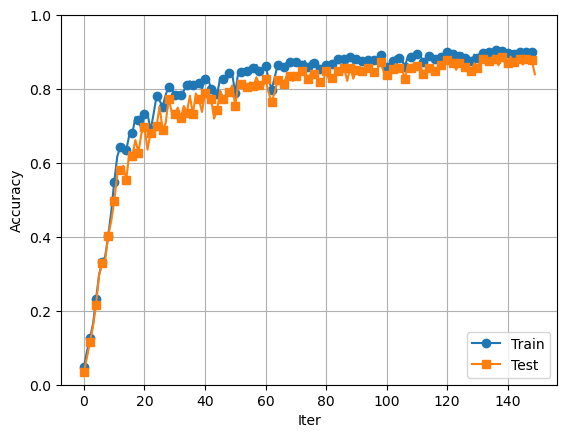

In [194]:
x = np.arange(cur_iter)
plt.plot(x, train_acc_list, marker="o", label="Train", markevery=2)
plt.plot(x, test_acc_list, marker="s", label="Test", markevery=2)
plt.grid()
plt.xlabel("Iter")
plt.ylabel("Accuracy")
plt.ylim(0, 1.0)
plt.legend(loc="lower right")

plt.show()

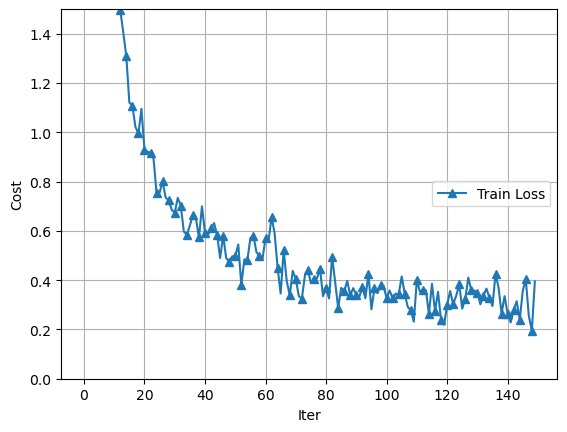

In [195]:
x = np.arange(cur_iter)
plt.plot(x, train_loss_list, marker="^", label="Train Loss", markevery=2)
plt.grid()
plt.xlabel("Iter")
plt.ylabel("Cost")
plt.ylim(0, 1.5)
plt.legend(loc="right")

plt.show()

### 생각보다 학습이 잘 되지 않았던 이유
- 학습 데이터의 수 부족
  - 학습 시간고려

- FC Layer의 노드수가 적절했는지

- 학습률(learning rate)값이 적절했는지

- ...

## 어떠한 조건에서 가장 좋은 결과를 내는지는 값을 **적절히** 바꾸어 시도해보아야함